# Mapping variable frequencing in top 50 songs by country

Import dependancies

In [37]:
%pip install mapclassify

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 3.0 MB/s eta 0:00:0000:0100:01
Note: you may need to restart the kernel to use updated packages.


In [38]:
import pandas as pd
import numpy as np
import scipy.stats as st
import matplotlib.pyplot as plt
from config import weather_apikey
import requests
import hvplot.pandas
import geopandas as gpd
import mapclassify

Read in data

In [4]:
file = 'universal_top_spotify_songs.csv'
rawdata = pd.read_csv(file)
relevant_countries = ['US', 'CA', 'BR', 'AR', 'GB', 'DE', 'KR', 'JP', 'NG', 'ZA', 'AU', 'NZ']
capital_cities = ['Washington', 'Ottawa', 'Brasilia', 'Buenos Aires', 'London', 'Berlin', 'Seoul', 'Tokyo', 'Abuja', 'Bloemfontein', 'Canberra', 'Wellington']
country_city_dict = dict(zip(relevant_countries, capital_cities))
city_country_dict = dict(zip(capital_cities, relevant_countries))

data = rawdata[rawdata['country'].isin(relevant_countries)]
data['capital_city'] = data['country'].map(country_city_dict)

data.head()

/var/folders/lb/xw277xn17wn0wd7v5v2846vm0000gn/T/ipykernel_18988/483375560.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data['capital_city'] = data['country'].map(country_city_dict)


,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,capital_city
50,5yyYL1FpimADTIftYQU0cg,iPlan,"Dlala Thukzin, Zaba, Sykes",1,0,0,ZA,2023-11-09,68,False,...,-10.253,0,0.0384,0.07090,0.584000,0.1010,0.748,118.004,4,Bloemfontein
51,5C9h6ZyskUiyAVDmhSfSdP,Imnandi lento (feat. Tman Xpress),"Mellow & Sleazy, SjavasDaDeejay, TitoM, Tman X...",2,0,0,ZA,2023-11-09,70,False,...,-13.325,0,0.0667,0.06000,0.000776,0.0231,0.632,111.982,4,Bloemfontein
52,7JbLSEDlRdoJaXk5ddZae2,Paris,"Mthandeni SK, Lwah Ndlunkulu",3,0,2,ZA,2023-11-09,64,False,...,-4.659,1,0.0693,0.02960,0.001990,0.1900,0.964,154.639,4,Bloemfontein
53,6Kijtp0DB6VwcoJIw7PJ9W,"Imithandazo (feat. Young Stunna, DJ Maphorisa,...","Kabza De Small, Mthunzi, DJ Maphorisa, Young S...",4,4,5,ZA,2023-11-09,59,False,...,-9.686,0,0.1120,0.17900,0.001260,0.1820,0.795,113.001,4,Bloemfontein
54,4URabg9AGHasjFEVdTbWcC,Dalie (feat. Baby S.O.N),"Kamo Mphela, Tyler ICU, Khalil Harrison, Baby ...",5,-1,-2,ZA,2023-11-09,46,False,...,-9.984,1,0.0515,0.00005,0.090100,0.1220,0.160,113.009,4,Bloemfontein


Extract long and lat data from geoapify api

In [5]:
# Set the API base URL
url = "http://api.openweathermap.org/data/2.5/weather?"

# Define an empty list to fetch the weather data for each city
city_data = []

# Create counters
record_count = 1
set_count = 1

# Loop through all the cities in our list to fetch coordinate data
for i, city in enumerate(capital_cities):
        
    # Create endpoint URL with each city
    city_url = url + "appid=" + weather_apikey + "&units=metric" + "&q=" + city
    
    # Log the url, record, and set numbers
    print("Processing Record %s of Set %s | %s" % (record_count, set_count, city))

    # Add 1 to the record count
    record_count += 1

    # Run an API request for each of the cities
    try:
        # Parse the JSON and retrieve data
        city_weather = requests.get(city_url).json()

        # Parse out latitude, longitude, max temp, humidity, cloudiness, wind speed, country, and date
        city_lat = city_weather['coord']['lat']
        city_lng = city_weather['coord']['lon']

        # Append the City information into city_data list
        city_data.append({"City": city, 
                          "Lat": city_lat, 
                          "Lng": city_lng})

    # If an error is experienced, skip the city
    except:
        print(f"City not found: {city}. Skipping...")
        pass
              
# Indicate that Data Loading is complete 
print("-----------------------------")
print("Data Retrieval Complete      ")
print("-----------------------------")

Processing Record 1 of Set 1 | Washington
Processing Record 2 of Set 1 | Ottawa
Processing Record 3 of Set 1 | Brasilia
Processing Record 4 of Set 1 | Buenos Aires
Processing Record 5 of Set 1 | London
Processing Record 6 of Set 1 | Berlin
Processing Record 7 of Set 1 | Seoul
Processing Record 8 of Set 1 | Tokyo
Processing Record 9 of Set 1 | Abuja
Processing Record 10 of Set 1 | Bloemfontein
Processing Record 11 of Set 1 | Canberra
Processing Record 12 of Set 1 | Wellington
-----------------------------
Data Retrieval Complete      
-----------------------------


In [6]:
print(city_data)

[{'City': 'Washington', 'Lat': 47.5001, 'Lng': -120.5015}, {'City': 'Ottawa', 'Lat': 45.4112, 'Lng': -75.6981}, {'City': 'Brasilia', 'Lat': -15.7797, 'Lng': -47.9297}, {'City': 'Buenos Aires', 'Lat': -34.6132, 'Lng': -58.3772}, {'City': 'London', 'Lat': 51.5085, 'Lng': -0.1257}, {'City': 'Berlin', 'Lat': 52.5244, 'Lng': 13.4105}, {'City': 'Seoul', 'Lat': 37.5683, 'Lng': 126.9778}, {'City': 'Tokyo', 'Lat': 35.6895, 'Lng': 139.6917}, {'City': 'Abuja', 'Lat': 9.0574, 'Lng': 7.4898}, {'City': 'Bloemfontein', 'Lat': -29.1211, 'Lng': 26.214}, {'City': 'Canberra', 'Lat': -35.2835, 'Lng': 149.1281}, {'City': 'Wellington', 'Lat': -41.2866, 'Lng': 174.7756}]


Merge spotify data with long and lat data

In [7]:
city_data

[{'City': 'Washington', 'Lat': 47.5001, 'Lng': -120.5015},
 {'City': 'Ottawa', 'Lat': 45.4112, 'Lng': -75.6981},
 {'City': 'Brasilia', 'Lat': -15.7797, 'Lng': -47.9297},
 {'City': 'Buenos Aires', 'Lat': -34.6132, 'Lng': -58.3772},
 {'City': 'London', 'Lat': 51.5085, 'Lng': -0.1257},
 {'City': 'Berlin', 'Lat': 52.5244, 'Lng': 13.4105},
 {'City': 'Seoul', 'Lat': 37.5683, 'Lng': 126.9778},
 {'City': 'Tokyo', 'Lat': 35.6895, 'Lng': 139.6917},
 {'City': 'Abuja', 'Lat': 9.0574, 'Lng': 7.4898},
 {'City': 'Bloemfontein', 'Lat': -29.1211, 'Lng': 26.214},
 {'City': 'Canberra', 'Lat': -35.2835, 'Lng': 149.1281},
 {'City': 'Wellington', 'Lat': -41.2866, 'Lng': 174.7756}]

In [8]:
city_data = pd.DataFrame(city_data)
city_data.rename(columns={'City':'capital_city'}, inplace=True)
city_data['country'] = city_data['capital_city'].map(city_country_dict)
city_data


,capital_city,Lat,Lng,country
0,Washington,47.5001,-120.5015,US
1,Ottawa,45.4112,-75.6981,CA
2,Brasilia,-15.7797,-47.9297,BR
3,Buenos Aires,-34.6132,-58.3772,AR
4,London,51.5085,-0.1257,GB
5,Berlin,52.5244,13.4105,DE
6,Seoul,37.5683,126.9778,KR
7,Tokyo,35.6895,139.6917,JP
8,Abuja,9.0574,7.4898,NG
9,Bloemfontein,-29.1211,26.2140,ZA


In [9]:
merged_data = pd.DataFrame.merge(data, city_data, on='capital_city')

In [10]:
acoustic_freq = data.groupby('country')['acousticness'].mean().reset_index(name='mean_acousticness')
acoustic_df = pd.DataFrame.merge(city_data, acoustic_freq, on='country')

acoustic_df

,capital_city,Lat,Lng,country,mean_acousticness
0,Washington,47.5001,-120.5015,US,0.250722
1,Ottawa,45.4112,-75.6981,CA,0.254626
2,Brasilia,-15.7797,-47.9297,BR,0.361667
3,Buenos Aires,-34.6132,-58.3772,AR,0.256982
4,London,51.5085,-0.1257,GB,0.235216
5,Berlin,52.5244,13.4105,DE,0.237837
6,Seoul,37.5683,126.9778,KR,0.306111
7,Tokyo,35.6895,139.6917,JP,0.147264
8,Abuja,9.0574,7.4898,NG,0.219850
9,Bloemfontein,-29.1211,26.2140,ZA,0.158683


In [11]:
%%capture --no-display

# Configure the map plot
acoustic_map = acoustic_df.hvplot.points(
    "Lng",
    "Lat",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 600,
    size = "mean_acousticness"*1000000,
    color = "capital_city",
    alpha = 0.5
)

# Display the map
acoustic_map

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Lng,Lat]   (capital_city)

In [12]:
artist_freq = data.groupby('country')['artists'].value_counts().reset_index(name='artist_frequency')
artist_df = pd.DataFrame.merge(city_data, artist_freq, on='country')

top_artist_per_country = artist_df.groupby('country')['artist_frequency'].idxmax()
top_artist_df = artist_df.loc[top_artist_per_country]

top_artist_df

,capital_city,Lat,Lng,country,artists,artist_frequency
196,Buenos Aires,-34.6132,-58.3772,AR,"Bizarrap, Milo j",107
613,Canberra,-35.2835,149.1281,AU,Taylor Swift,249
137,Brasilia,-15.7797,-47.9297,BR,Henrique & Juliano,69
67,Ottawa,45.4112,-75.6981,CA,Taylor Swift,232
314,Berlin,52.5244,13.4105,DE,AYLIVA,111
249,London,51.5085,-0.1257,GB,Taylor Swift,228
433,Tokyo,35.6895,139.6917,JP,Mrs. GREEN APPLE,115
392,Seoul,37.5683,126.9778,KR,Lim Young Woong,285
471,Abuja,9.0574,7.4898,NG,Asake,76
662,Wellington,-41.2866,174.7756,NZ,Taylor Swift,197


In [13]:
%%capture --no-display

# Configure the map plot
artist_map = top_artist_df.hvplot.points(
    "Lng",
    "Lat",
    geo = True,
    tiles = "OSM",
    frame_width = 800,
    frame_height = 600,
    size = 100,
    color = "artists",
    alpha = 0.9
)

# Display the map
artist_map

:Overlay
   .WMTS.I   :WMTS   [Longitude,Latitude]
   .Points.I :Points   [Lng,Lat]   (artists)

In [14]:
data

,spotify_id,name,artists,daily_rank,daily_movement,weekly_movement,country,snapshot_date,popularity,is_explicit,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,capital_city
50,5yyYL1FpimADTIftYQU0cg,iPlan,"Dlala Thukzin, Zaba, Sykes",1,0,0,ZA,2023-11-09,68,False,...,-10.253,0,0.0384,0.07090,0.584000,0.1010,0.748,118.004,4,Bloemfontein
51,5C9h6ZyskUiyAVDmhSfSdP,Imnandi lento (feat. Tman Xpress),"Mellow & Sleazy, SjavasDaDeejay, TitoM, Tman X...",2,0,0,ZA,2023-11-09,70,False,...,-13.325,0,0.0667,0.06000,0.000776,0.0231,0.632,111.982,4,Bloemfontein
52,7JbLSEDlRdoJaXk5ddZae2,Paris,"Mthandeni SK, Lwah Ndlunkulu",3,0,2,ZA,2023-11-09,64,False,...,-4.659,1,0.0693,0.02960,0.001990,0.1900,0.964,154.639,4,Bloemfontein
53,6Kijtp0DB6VwcoJIw7PJ9W,"Imithandazo (feat. Young Stunna, DJ Maphorisa,...","Kabza De Small, Mthunzi, DJ Maphorisa, Young S...",4,4,5,ZA,2023-11-09,59,False,...,-9.686,0,0.1120,0.17900,0.001260,0.1820,0.795,113.001,4,Bloemfontein
54,4URabg9AGHasjFEVdTbWcC,Dalie (feat. Baby S.O.N),"Kamo Mphela, Tyler ICU, Khalil Harrison, Baby ...",5,-1,-2,ZA,2023-11-09,46,False,...,-9.984,1,0.0515,0.00005,0.090100,0.1220,0.160,113.009,4,Bloemfontein
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83829,3WndNMJo029mMO64l9hGFm,Dale Mecha,Mesita,46,4,0,AR,2023-10-18,78,False,...,-4.360,0,0.4310,0.30000,0.000000,0.1060,0.441,146.286,3,Buenos Aires
83830,6abr2lKyMZTy21gSPWm7aG,Entre Beso y Beso,Ke Personajes,47,3,0,AR,2023-10-18,76,False,...,-1.669,0,0.0536,0.57000,0.000000,0.2060,0.906,85.962,4,Buenos Aires
83831,7BVMtLpd7edHeOizt4RWz9,Frágil,"Yahritza Y Su Esencia, Grupo Frontera",48,2,0,AR,2023-10-18,78,False,...,-4.515,1,0.0309,0.36500,0.000000,0.1120,0.393,149.918,4,Buenos Aires
83832,4qSEvFGCpde73gqIuq3sho,HIBIKI,"Bad Bunny, Mora",49,1,0,AR,2023-10-18,88,True,...,-5.605,0,0.0706,0.60400,0.000000,0.1180,0.528,119.935,4,Buenos Aires


In [22]:
heatmap_data = data[data['is_explicit'] == True].groupby('country').size().reset_index(name='count')
heatmap_data['CODE'] = ('ARG', 'AUS', 'BRA', 'CAN', 'DEU', 'GBR', 'JPN', 'KOR', 'NGA', 'NZL', 'USA', 'ZAF')
print(heatmap_data)

   country  count CODE
0       AR    407  ARG
1       AU    403  AUS
2       BR    275  BRA
3       CA    453  CAN
4       DE    299  DEU
5       GB    353  GBR
6       JP     46  JPN
7       KR    137  KOR
8       NG    487  NGA
9       NZ    334  NZL
10      US    525  USA
11      ZA    337  ZAF


In [23]:
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.columns=['pop_est', 'continent', 'name', 'CODE', 'gdp_md_est', 'geometry']
world

/var/folders/lb/xw277xn17wn0wd7v5v2846vm0000gn/T/ipykernel_18988/1572249649.py:1: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


,pop_est,continent,name,CODE,gdp_md_est,geometry
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000..."
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982..."
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948..."
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742..."
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000..."
...,...,...,...,...,...,...
172,6944975.0,Europe,Serbia,SRB,51475,"POLYGON ((18.82982 45.90887, 18.82984 45.90888..."
173,622137.0,Europe,Montenegro,MNE,5542,"POLYGON ((20.07070 42.58863, 19.80161 42.50009..."
174,1794248.0,Europe,Kosovo,-99,7926,"POLYGON ((20.59025 41.85541, 20.52295 42.21787..."
175,1394973.0,North America,Trinidad and Tobago,TTO,24269,"POLYGON ((-61.68000 10.76000, -61.10500 10.890..."


In [40]:
heatmap_data2 = pd.merge(world, heatmap_data, on='CODE', how='left').fillna(0)
heatmap_data2


,pop_est,continent,name,CODE,gdp_md_est,geometry,country,count
0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",0,0.0
1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",0,0.0
2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",0,0.0
3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",CA,453.0
4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",US,525.0
...,...,...,...,...,...,...,...,...
172,6944975.0,Europe,Serbia,SRB,51475,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",0,0.0
173,622137.0,Europe,Montenegro,MNE,5542,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",0,0.0
174,1794248.0,Europe,Kosovo,-99,7926,"POLYGON ((20.59025 41.85541, 20.52295 42.21787...",0,0.0
175,1394973.0,North America,Trinidad and Tobago,TTO,24269,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",0,0.0


In [41]:
# merge again with  location data which contains each country’s latitude and longitude
location = pd.read_csv('countries_latitude_longitude.csv')
heatmap_data_final=pd.merge(heatmap_data2, location, on='name').reset_index()
heatmap_data_final

,index,pop_est,continent,name,CODE,gdp_md_est,geometry,country,count,latitude,longitude
0,0,889953.0,Oceania,Fiji,FJI,5496,"MULTIPOLYGON (((180.00000 -16.06713, 180.00000...",0,0.0,-16.578193,179.414413
1,1,58005463.0,Africa,Tanzania,TZA,63177,"POLYGON ((33.90371 -0.95000, 34.07262 -1.05982...",0,0.0,-6.369028,34.888822
2,2,603253.0,Africa,W. Sahara,ESH,907,"POLYGON ((-8.66559 27.65643, -8.66512 27.58948...",0,0.0,24.215527,-12.885834
3,3,37589262.0,North America,Canada,CAN,1736425,"MULTIPOLYGON (((-122.84000 49.00000, -122.9742...",CA,453.0,56.130366,-106.346771
4,4,328239523.0,North America,United States of America,USA,21433226,"MULTIPOLYGON (((-122.84000 49.00000, -120.0000...",US,525.0,37.090240,-95.712891
...,...,...,...,...,...,...,...,...,...,...,...
151,151,3301000.0,Europe,Bosnia and Herz.,BIH,20164,"POLYGON ((18.56000 42.65000, 17.67492 43.02856...",0,0.0,43.915886,17.679076
152,152,6944975.0,Europe,Serbia,SRB,51475,"POLYGON ((18.82982 45.90887, 18.82984 45.90888...",0,0.0,44.016521,21.005859
153,153,622137.0,Europe,Montenegro,MNE,5542,"POLYGON ((20.07070 42.58863, 19.80161 42.50009...",0,0.0,42.708678,19.374390
154,154,1394973.0,North America,Trinidad and Tobago,TTO,24269,"POLYGON ((-61.68000 10.76000, -61.10500 10.890...",0,0.0,10.691803,-61.222503


In [51]:
from matplotlib.colors import LinearSegmentedColormap
colors = [(0.8, 0.8, 0.8), (0.6, 0.8, 0.6), (0.0, 0.5, 0.0)]  # RGB values
cmap = LinearSegmentedColormap.from_list('light_gray_to_dark_green', colors)

TypeError: 'method' object is not subscriptable

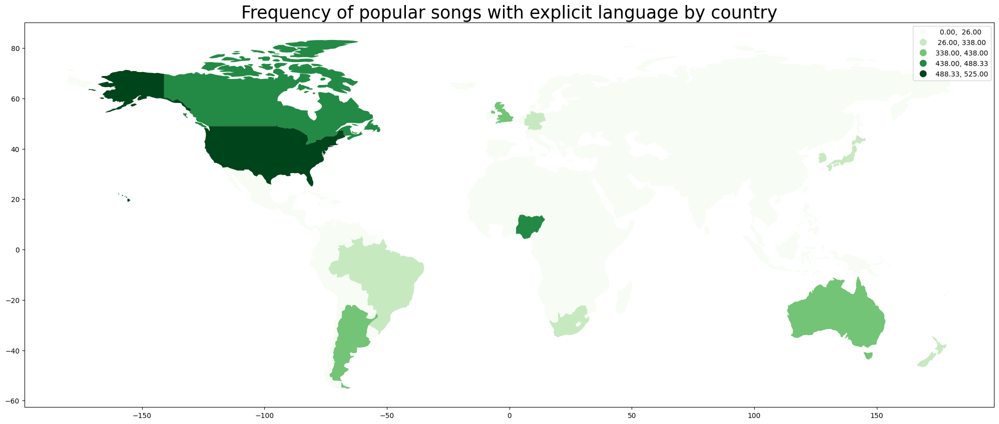

In [57]:
# plot explicit countries  world map 
heatmap_data_final.plot(column='count', scheme='headtail_breaks',
           figsize=(25, 20),
           legend=True,cmap='Greens')
plt.title('Frequency of popular songs with explicit language by country',fontsize=25)
# add countries names and numbers 
for i in range(0,10):
    plt.text(float(heatmap_data_final.longitude[i]),float(heatmap_data_final.latitude[i]),"{}\n{}".format(heatmap_data_final.name[i],heatmap_data_final.count[i]),size=10)
plt.show()